In [ ]:
import numpy as np
import pandas as pd

In [ ]:
df_calls = pd.read_csv('/content/callsf0d4f5a.csv')
df_customer = pd.read_csv('/content/customers2afd6ea.csv')
df_reason = pd.read_csv('/content/reason18315ff.csv')
df_sentiment = pd.read_csv('/content/sentiment_statisticscc1e57a.csv')

## start **2**

In [ ]:
mrg_df= pd.merge(pd.merge(pd.merge(df_calls,df_customer,on='customer_id'),df_sentiment, on='call_id'),df_reason, on='call_id')
mrg_df.to_excel('/data_.xlsx')

In [ ]:
mrg_df.isnull().sum()

,0
call_id,0
customer_id,0
agent_id_x,0
call_start_datetime,0
agent_assigned_datetime,0
call_end_datetime,0
call_transcript,0
customer_name,0
elite_level_code,23959
agent_id_y,0


In [ ]:
mrg_df.duplicated().sum()

0

In [ ]:


import re

def clean_call_reason(reason):

    if not isinstance(reason, str):
        try:
            reason = str(reason)
        except (TypeError, ValueError):
            return reason
    # Convert to lowercas
    reason = reason.lower()
    # Remove special characters and digits
    reason = re.sub(r'[^a-z\s]', '', reason)
    # Remove extra spaces
    reason = re.sub(r'\s+', ' ', reason).strip()
    return reason


In [ ]:
mrg_df['cleaned_call_reason'] = mrg_df['primary_call_reason'].apply(clean_call_reason)

In [ ]:
standardization_map = {
    'IRROPS': 'IRROPS',
    'Voluntary Change': 'Voluntary Change',
    'Voluntary Cancel': 'Voluntary Cancellation',
    'Seating': 'Seating',
    'Mileage Plus': 'Mileage Plus',
    'Post-Flight': 'Post-Flight',
    'Post Flight': 'Post-Flight',
    'Communications': 'Communications',
    'Products and Services': 'Products and Services',
    'Products & Services': 'Products and Services',
    'Upgrade': 'Upgrade',
    'Baggage': 'Baggage',
    'Booking': 'Booking',
    'Checkout': 'Checkout',
    'Check-In': 'Check-In',
    'Check In': 'Check-In',
    'Digital Support': 'Digital Support',
    'Other':'Other',
    'Other Topics': 'Other ',
    'ETC': 'ETC',
    'Traveler Updates': 'Traveler Updates',
    'Schedule Change': 'Schedule Change',
    'Disability': 'Disability',
    'Unaccompanied Minor': 'Unaccompanied Minor'
}

# Function to standardize the call reason
def standardize_reason(reason):
    return standardization_map.get(reason, 'Notdefined')

# Apply the standardization
mrg_df['final_call_reason'] = mrg_df['primary_call_reason'].apply(standardize_reason)



In [ ]:
!pip install wordcloud

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import pandas as pd
import string

# Function to generate and display word cloud for a specific text
def generate_wordcloud(text, title, stopwords=None):
    if stopwords is None:
        stopwords = set(STOPWORDS)

    # Check if the text is empty before generating the word cloud
    if len(text.strip()) > 0:
        wordcloud = WordCloud(width=800, height=400, background_color='white', stopwords=stopwords).generate(text)
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(title, fontsize=20)
        plt.show()
    else:
        print(f"No words available for the word cloud for: {title}")

# Preprocessing function to clean and preprocess text
def preprocess_text(text):
    # Convert to lowercase, remove punctuation and digits
    text = text.lower().translate(str.maketrans('', '', string.punctuation + string.digits))
    return text

# Add domain-specific stopwords (e.g., flight-related terms, general help phrases)
custom_stopwords = set(STOPWORDS).union({"will","go","name","better","today","airlines","please","make","day","thanks","customer","united","airline","time","calling","youre","hi","see","flight", "help", "take", "look", "agent", "call","need","thank","unites","know","let","looks","change","work",})


# Get the list of unique primary call reasons
primary_call_reasons = mrg_df['final_call_reason'].unique()

grouped_transcripts = mrg_df.groupby('final_call_reason')['call_transcript'].apply(lambda x: ' '.join(x))

# Loop through each primary call reason and generate a word cloud
for reason, transcripts in grouped_transcripts.items():
    # Preprocess the combined transcripts for each reason
    transcripts_text = preprocess_text(transcripts)

    # Generate word cloud for this reason with custom stopwords
    generate_wordcloud(transcripts_text, title=f"Word Cloud for: {reason}", stopwords=custom_stopwords)




KeyboardInterrupt: 

In [ ]:


# Check for equality between agent_id_x and agent_id_y
mrg_df['agents_equal'] = mrg_df['agent_id_x'] == mrg_df['agent_id_y']

# Display the count of rows where they are equal and not equal
equal_count = mrg_df['agents_equal'].sum()
not_equal_count = (~mrg_df['agents_equal']).sum()

print(f"Count of rows where agent_id_x and agent_id_y are equal: {equal_count}")
print(f"Count of rows where agent_id_x and agent_id_y are not equal: {not_equal_count}")

# Optionally, display rows where they are not equal
mismatched_agents = mrg_df[~mrg_df['agents_equal']]
print("\nRows where agent_id_x and agent_id_y are not equal:\n", mismatched_agents[['agent_id_x', 'agent_id_y']])


Count of rows where agent_id_x and agent_id_y are equal: 66653
Count of rows where agent_id_x and agent_id_y are not equal: 0

Rows where agent_id_x and agent_id_y are not equal:
 Empty DataFrame
Columns: [agent_id_x, agent_id_y]
Index: []


In [ ]:
mrg_df=mrg_df.drop(columns=['agents_equal','agent_id_y'])

In [ ]:

from dateutil import parser


def parse_date(date_str):
    if isinstance(date_str, str):
        try:
            return parser.parse(date_str)
        except ValueError:
            return None
    else:
        return date_str

# Apply the function to the columns
mrg_df['call_start_datetime'] = mrg_df['call_start_datetime'].apply(parse_date)
mrg_df['call_end_datetime'] = mrg_df['call_end_datetime'].apply(parse_date)
mrg_df['agent_assigned_datetime'] = mrg_df['agent_assigned_datetime'].apply(parse_date)
# Convert the columns to a single datetime format

mrg_df['call_start_datetime'] = pd.to_datetime(mrg_df['call_start_datetime'])
mrg_df['agent_assigned_datetime'] = pd.to_datetime(mrg_df['agent_assigned_datetime'])
mrg_df['call_end_datetime'] = pd.to_datetime(mrg_df['call_end_datetime'])

# Print the first few rows of the dataframe to verify the conversion
mrg_df.head()

,call_id,customer_id,agent_id_x,call_start_datetime,agent_assigned_datetime,call_end_datetime,call_transcript,customer_name,elite_level_code,agent_tone,customer_tone,average_sentiment,silence_percent_average,primary_call_reason,cleaned_call_reason,final_call_reason
0,4667960400,2033123310,963118,2024-07-31 23:56:00,2024-08-01 00:03:00,2024-08-01 00:34:00,\n\nAgent: Thank you for calling United Airlin...,Matthew Foster,4.0,neutral,angry,-0.04,0.39,Voluntary Cancel,voluntary cancel,Notdefined
1,1122072124,8186702651,519057,2024-08-01 00:03:00,2024-08-01 00:06:00,2024-08-01 00:18:00,\n\nAgent: Thank you for calling United Airlin...,Tammy Walters,NaN,calm,neutral,0.02,0.35,Booking,booking,Booking
2,6834291559,2416856629,158319,2024-07-31 23:59:00,2024-08-01 00:07:00,2024-08-01 00:26:00,\n\nAgent: Thank you for calling United Airlin...,Jeffery Dixon,NaN,neutral,polite,-0.13,0.32,IRROPS,irrops,IRROPS
3,2266439882,1154544516,488324,2024-08-01 00:05:00,2024-08-01 00:10:00,2024-08-01 00:17:00,\n\nAgent: Thank you for calling United Airlin...,David Wilkins,2.0,neutral,frustrated,-0.20,0.20,Upgrade,upgrade,Upgrade
4,1211603231,5214456437,721730,2024-08-01 00:04:00,2024-08-01 00:14:00,2024-08-01 00:23:00,\n\nAgent: Thank you for calling United Airlin...,Elizabeth Daniels,0.0,neutral,polite,-0.05,0.35,Seating,seating,Seating


In [ ]:
mrg_df['call_duration'] = (mrg_df['call_end_datetime'] - mrg_df['call_start_datetime']).dt.total_seconds()

# Step 3: Calculate Waiting Time for AST
mrg_df['waiting_time'] = (mrg_df['agent_assigned_datetime'] - mrg_df['call_start_datetime']).dt.total_seconds()

# Step 4: Calculate AHT and AST
total_calls = len(mrg_df)

average_aht = mrg_df['call_duration'].mean()  # Average Handle Time in seconds
average_aht_minutes = average_aht / 60  # Convert to minutes

average_ast = mrg_df['waiting_time'].mean()  # Average Speed to Answer in seconds
average_ast_minutes = average_ast / 60  # Convert to minutes

# Display the calculated AHT and AST
print(f"Average Handle Time (AHT): {average_aht_minutes:.2f} minutes")
print(f"Average Speed to Answer (AST): {average_ast_minutes:.2f} minutes")

Average Handle Time (AHT): 18.90 minutes
Average Speed to Answer (AST): 7.28 minutes


In [ ]:
mrg_df=mrg_df.drop(columns=['primary_call_reason','cleaned_call_reason'])

In [ ]:

  mrg_df.columns

Index(['call_id', 'customer_id', 'agent_id_x', 'call_start_datetime',
       'agent_assigned_datetime', 'call_end_datetime', 'call_transcript',
       'customer_name', 'elite_level_code', 'agent_tone', 'customer_tone',
       'average_sentiment', 'silence_percent_average', 'final_call_reason',
       'call_duration', 'waiting_time'],
      dtype='object')

### ***VISUALIZATION***

In [ ]:
mrg_df.groupby(['agent_tone', 'customer_tone'])[['call_duration','waiting_time','silence_percent_average']].mean()

call_duration  waiting_time  silence_percent_average
agent_tone customer_tone                                                      
angry      angry             939.166667    439.166667                 0.241806
           calm              801.904762    436.190476                 0.166667
           frustrated        811.084337    435.180723                 0.179639
           neutral           737.368421    408.157895                 0.176053
           polite            785.000000    408.333333                 0.180139
calm       angry            1060.022051    444.674752                 0.295294
           calm             1078.995870    441.504021                 0.291678
           frustrated       1072.465362    441.667033                 0.288302
           neutral          1072.934313    445.877269                 0.292029
           polite           1070.680376    444.939838                 0.289110
frustrated angry            1044.585799    423.106509                 0.253994
           calm             1040.598425    420.755906                 0.255937
           frustrated       1001.589958    424.435146                 0.235397
           neutral          1099.137931    432.586207                 0.257629
           polite           1033.613445    417.563025                 0.251190
neutral    angry            1182.712753    433.611180                 0.283444
           calm             1186.935117    435.927796                 0.285244
           frustrated       1179.000767    434.520828                 0.287202
           neutral          1195.381132    433.554717                 0.291287
           polite           1176.431795    433.578235                 0.284653
polite     angry             813.750000    446.250000                 0.330000
           calm              676.000000    536.000000                 0.180000
           frustrated        652.500000    450.000000                 0.178125
           neutral           693.750000    453.750000                 0.277500
           polite            600.000000    433.333333                 0.283333

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


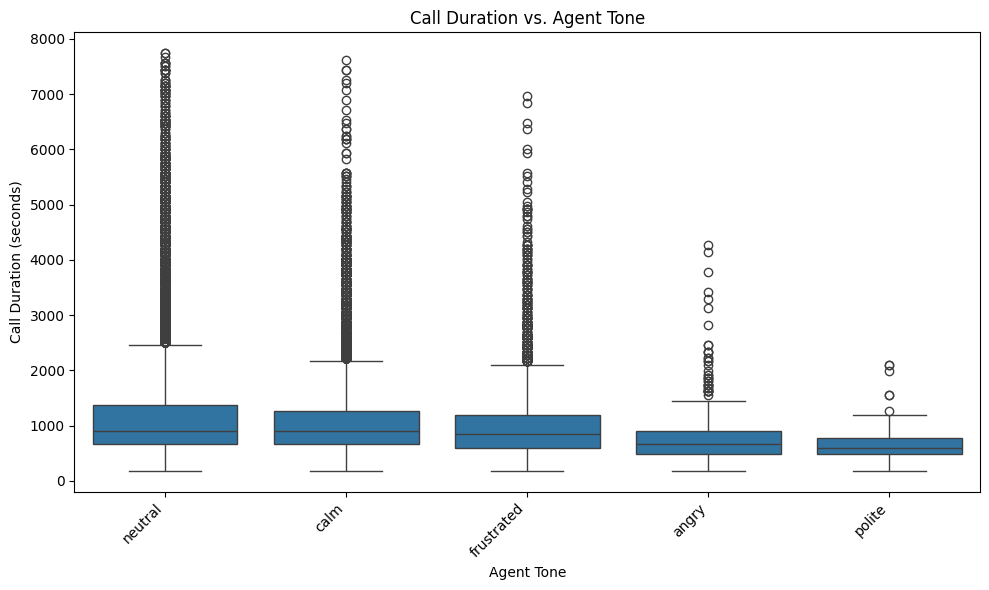

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
sns.boxplot(x='agent_tone', y='call_duration', data=mrg_df)
plt.title('Call Duration vs. Agent Tone')
plt.xlabel('Agent Tone')
plt.ylabel('Call Duration (seconds)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [ ]:
# Correlation matrix for numerical columns
correlation_matrix = mrg_df[['average_sentiment', 'silence_percent_average', 'elite_level_code']].corr()
print(correlation_matrix)


                         average_sentiment  silence_percent_average  \
average_sentiment                 1.000000                 0.034904   
silence_percent_average           0.034904                 1.000000   
elite_level_code                  0.002612                -0.004698   

                         elite_level_code  
average_sentiment                0.002612  
silence_percent_average         -0.004698  
elite_level_code                 1.000000  


In [ ]:
mrg_df.describe()

,call_id,customer_id,agent_id_x,call_start_datetime,agent_assigned_datetime,call_end_datetime,elite_level_code,average_sentiment,silence_percent_average,call_duration,waiting_time
count,6.665300e+04,6.665300e+04,66653.000000,66653,66653,66653,42694.000000,66552.000000,66653.000000,66653.000000,66653.000000
mean,4.993883e+09,5.006607e+09,564623.782936,2024-08-16 11:00:46.465725440,2024-08-16 11:08:03.437804800,2024-08-16 11:19:40.614525952,1.370099,-0.033628,0.285446,1134.148801,436.972079
min,1.316420e+05,4.430700e+05,102574.000000,2024-07-31 23:56:00,2024-08-01 00:03:00,2024-08-01 00:17:00,0.000000,-1.380000,0.000000,180.000000,180.000000
25%,2.481353e+09,2.514373e+09,347606.000000,2024-08-09 11:25:00,2024-08-09 11:32:00,2024-08-09 11:45:00,0.000000,-0.110000,0.130000,660.000000,300.000000
50%,4.987649e+09,5.006072e+09,591778.000000,2024-08-17 09:12:00,2024-08-17 09:19:00,2024-08-17 09:31:00,1.000000,-0.020000,0.260000,900.000000,420.000000
75%,7.495496e+09,7.509114e+09,786323.000000,2024-08-24 14:22:00,2024-08-24 14:29:00,2024-08-24 14:40:00,2.000000,0.050000,0.410000,1320.000000,540.000000
max,9.999806e+09,9.999935e+09,993862.000000,2024-08-31 23:55:00,2024-08-31 23:59:00,2024-09-01 01:33:00,5.000000,2.670000,0.980000,7740.000000,900.000000
std,2.889665e+09,2.883582e+09,257493.355821,NaN,NaN,NaN,1.322081,0.143693,0.192104,784.802044,151.155331


                         call_duration  waiting_time  average_sentiment  \
call_duration                 1.000000      0.165140          -0.067111   
waiting_time                  0.165140      1.000000           0.041316   
average_sentiment            -0.067111      0.041316           1.000000   
silence_percent_average       0.400066     -0.013198           0.034904   

                         silence_percent_average  
call_duration                           0.400066  
waiting_time                           -0.013198  
average_sentiment                       0.034904  
silence_percent_average                 1.000000  


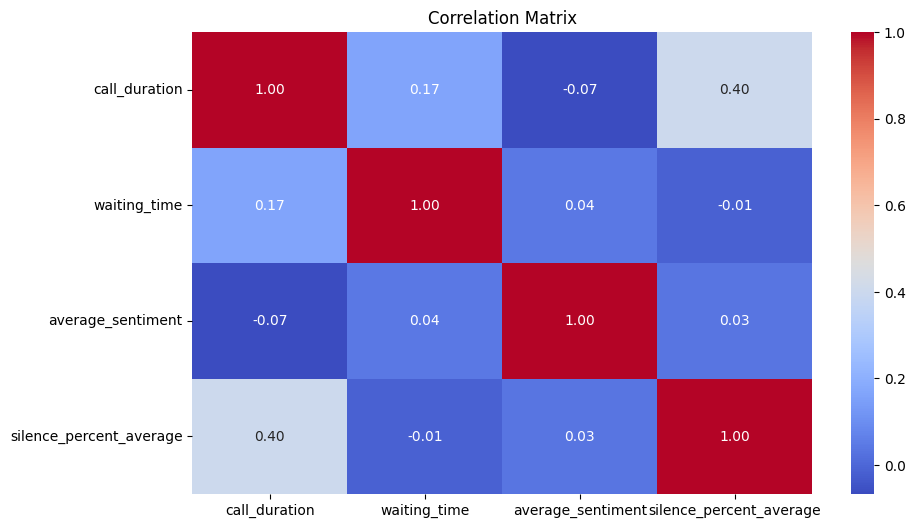

In [ ]:

correlation_matrix = mrg_df[['call_duration', 'waiting_time', 'average_sentiment', 'silence_percent_average']].corr()
print(correlation_matrix)

# Optional: Heatmap for Visualization
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()


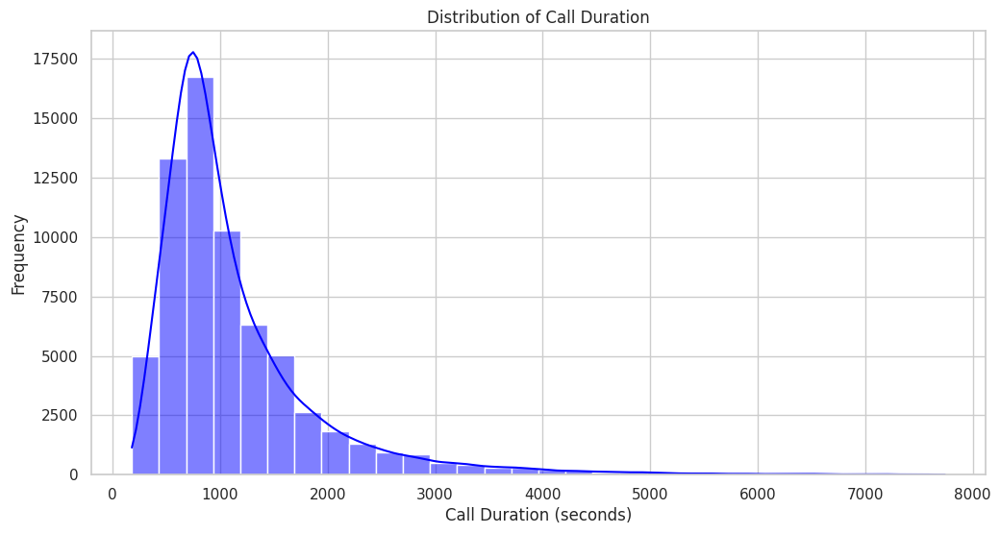

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


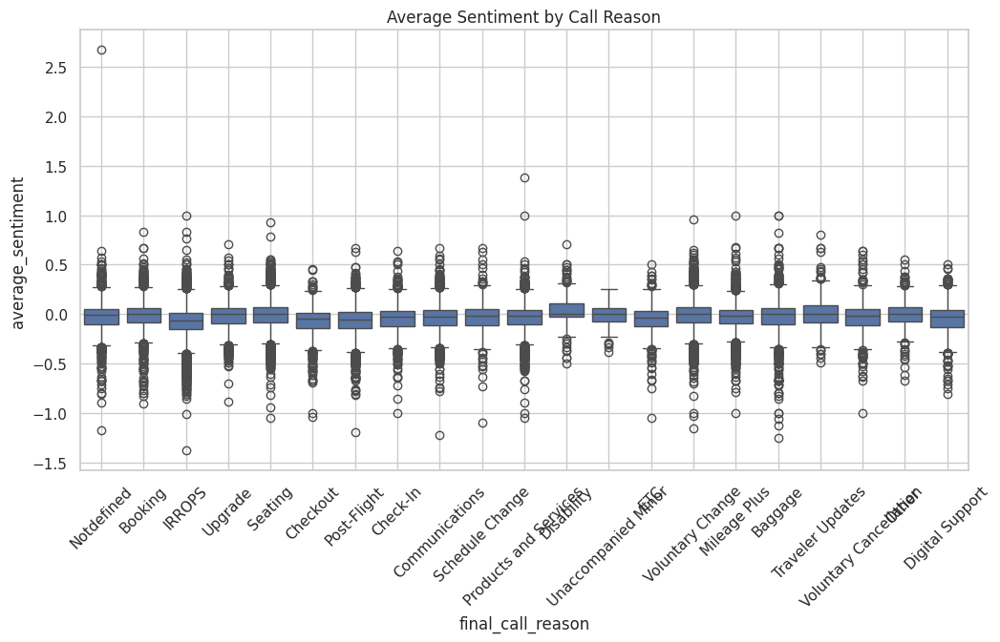

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Setting the aesthetic style of the plots
sns.set(style="whitegrid")

# Histogram for Call Duration
plt.figure(figsize=(12, 6))
sns.histplot(mrg_df['call_duration'], bins=30, kde=True, color='blue')
plt.title('Distribution of Call Duration')
plt.xlabel('Call Duration (seconds)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Box Plot for Average Sentiment by Call Reason
plt.figure(figsize=(12, 6))
sns.boxplot(data=mrg_df, x='final_call_reason', y='average_sentiment')
plt.title('Average Sentiment by Call Reason')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


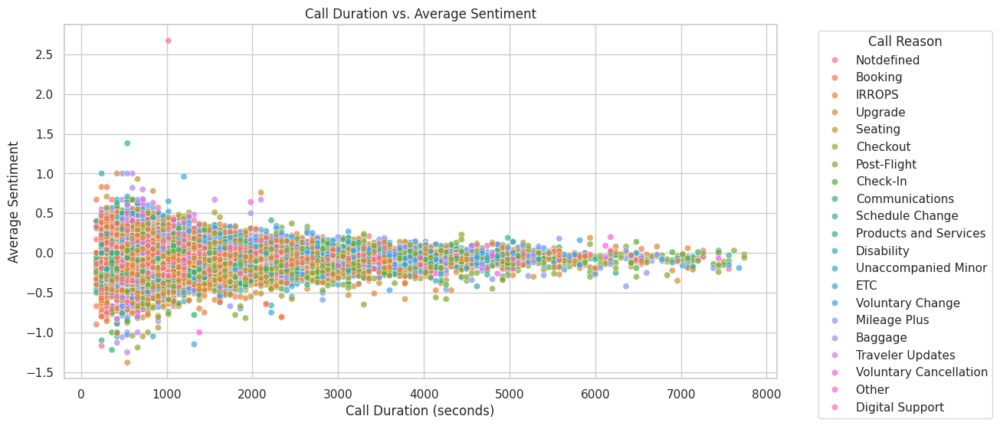

In [ ]:
plt.figure(figsize=(12, 6))
sns.scatterplot(data=mrg_df, x='call_duration', y='average_sentiment', hue='final_call_reason', alpha=0.7)
plt.title('Call Duration vs. Average Sentiment')
plt.xlabel('Call Duration (seconds)')
plt.ylabel('Average Sentiment')
plt.legend(title='Call Reason', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()


<ipython-input-52-8d8ab1470c2e>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=avg_waiting_time, x='waiting_time', y='final_call_reason', palette='viridis')
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarni

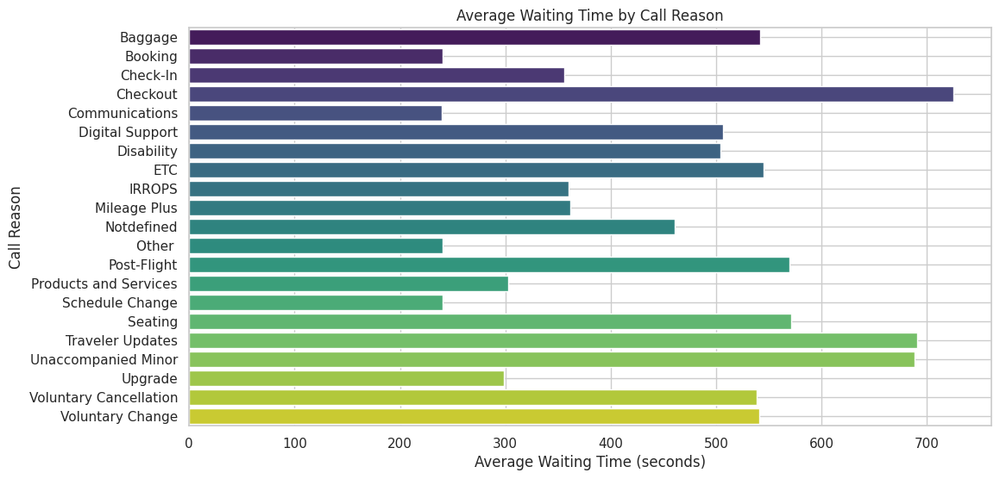

In [ ]:
# Grouping by call reason to calculate average waiting time
avg_waiting_time = mrg_df.groupby('final_call_reason')['waiting_time'].mean().reset_index()

# Bar plot for average waiting time by call reason
plt.figure(figsize=(12, 6))
sns.barplot(data=avg_waiting_time, x='waiting_time', y='final_call_reason', palette='viridis')
plt.title('Average Waiting Time by Call Reason')
plt.xlabel('Average Waiting Time (seconds)')
plt.ylabel('Call Reason')
plt.grid(True)
plt.show()


<ipython-input-53-9e11b8f31333>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=avg_sentiment_by_agent, x='average_sentiment', y='agent_id_x', palette='mako')
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarn

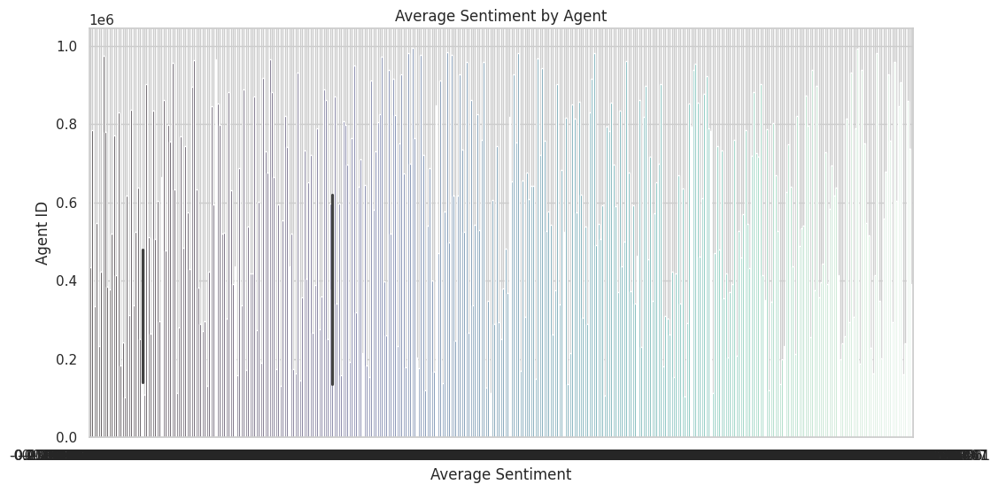

In [ ]:
# Average sentiment by agent
avg_sentiment_by_agent = mrg_df.groupby('agent_id_x')['average_sentiment'].mean().reset_index()

# Bar plot for average sentiment by agent
plt.figure(figsize=(12, 6))
sns.barplot(data=avg_sentiment_by_agent, x='average_sentiment', y='agent_id_x', palette='mako')
plt.title('Average Sentiment by Agent')
plt.xlabel('Average Sentiment')
plt.ylabel('Agent ID')
plt.grid(True)
plt.show()


<ipython-input-54-9c59d6882619>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=mrg_df, x='agent_tone', y='call_duration', palette='pastel')
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to g

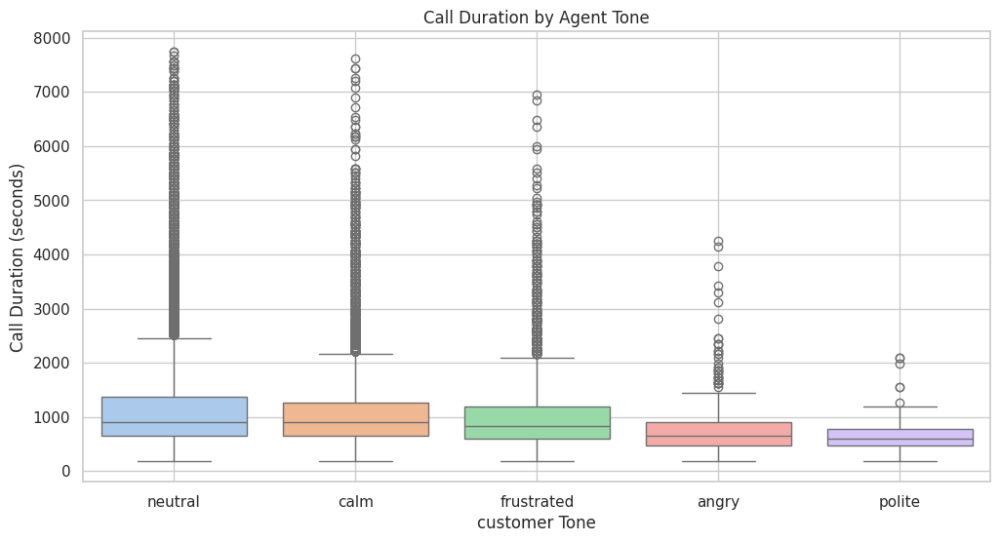

In [ ]:
# Box plot for call duration by agent tone
plt.figure(figsize=(12, 6))
sns.boxplot(data=mrg_df, x='agent_tone', y='call_duration', palette='pastel')
plt.title('Call Duration by Agent Tone')
plt.xlabel('customer Tone')
plt.ylabel('Call Duration (seconds)')
plt.grid(True)
plt.show()


<ipython-input-55-ab17a413dbd4>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=avg_sentiment_by_elite, x='elite_level_code', y='average_sentiment', palette='rocket')
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: Fu

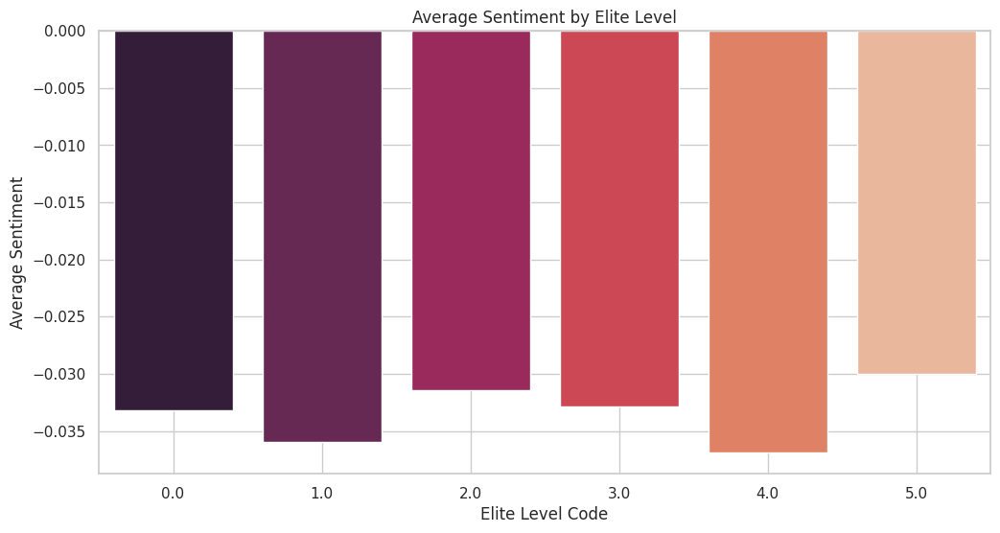

In [ ]:
# Average sentiment by elite level
avg_sentiment_by_elite = mrg_df.groupby('elite_level_code')['average_sentiment'].mean().reset_index()

# Bar plot for average sentiment by elite level
plt.figure(figsize=(12, 6))
sns.barplot(data=avg_sentiment_by_elite, x='elite_level_code', y='average_sentiment', palette='rocket')
plt.title('Average Sentiment by Elite Level')
plt.xlabel('Elite Level Code')
plt.ylabel('Average Sentiment')
plt.grid(True)
plt.show()


**TRY5**

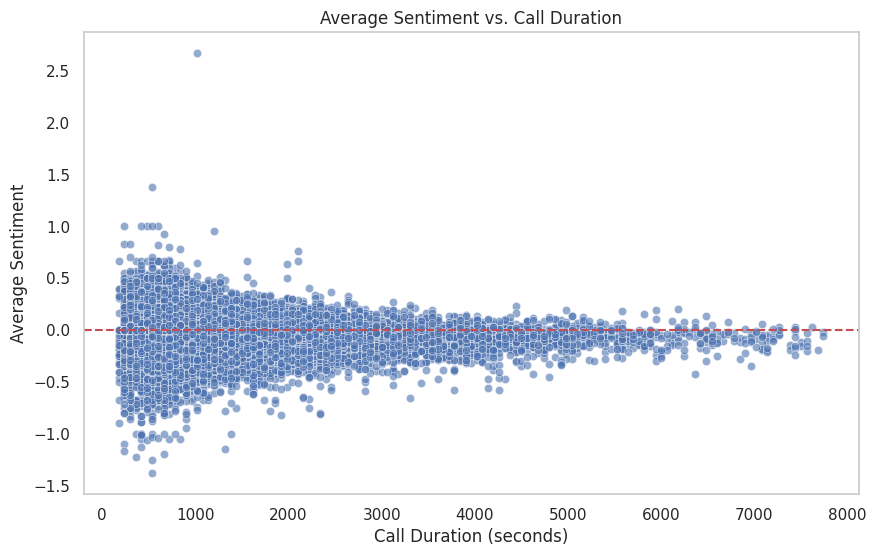

In [ ]:
# Simple Scatter Plot: Average Sentiment vs. Call Duration
plt.figure(figsize=(10, 6))
sns.scatterplot(data=mrg_df, x='call_duration', y='average_sentiment', alpha=0.6)
plt.title('Average Sentiment vs. Call Duration')
plt.xlabel('Call Duration (seconds)')
plt.ylabel('Average Sentiment')
plt.axhline(y=0, color='r', linestyle='--')  # Add a horizontal line at y=0 for reference
plt.grid()
plt.show()


AVG HABDLE TIME WRT OT REASON

In [ ]:
# Grouping by final_call_reason to calculate AHT
aht_by_reason = mrg_df.groupby('final_call_reason').agg(
    total_handle_time=('call_duration', 'sum'),
    total_calls=('call_duration', 'count')
).reset_index()

# Calculate AHT in minutes
aht_by_reason['AHT_minutes'] = (aht_by_reason['total_handle_time'] / aht_by_reason['total_calls']) / 60

# Selecting relevant columns for clarity
aht_by_reason = aht_by_reason[['final_call_reason', 'AHT_minutes', 'total_calls', 'total_handle_time']]

# Display the AHT by call reason
print(aht_by_reason)


         final_call_reason  AHT_minutes  total_calls  total_handle_time
0                  Baggage    14.605505         2616          2292480.0
1                  Booking    11.099652         2589          1724220.0
2                 Check-In    15.464000         1875          1739700.0
3                 Checkout    28.889674         1840          3189420.0
4           Communications    17.779571         3779          4031340.0
5          Digital Support    14.746988          996           881280.0
6               Disability    13.238579          394           312960.0
7                      ETC    24.878495          930          1388220.0
8                   IRROPS    19.094432        13057         14958960.0
9             Mileage Plus    22.615819         5487          7445580.0
10              Notdefined    18.249147         2930          3208200.0
11                  Other     10.047535          568           342420.0
12             Post-Flight    25.033946         4242          63

In [ ]:
calls_by_agent_reason = mrg_df.groupby(['agent_id_x', 'final_call_reason']).size().reset_index(name='call_count')

# Display the results
print(calls_by_agent_reason)


      agent_id_x       final_call_reason  call_count
0         102574                  IRROPS           1
1         102574             Post-Flight           1
2         103651                 Baggage           6
3         103651                 Booking           7
4         103651                Check-In           8
...          ...                     ...         ...
6233      993862                 Seating          34
6234      993862        Traveler Updates           5
6235      993862                 Upgrade          10
6236      993862  Voluntary Cancellation           3
6237      993862        Voluntary Change          56

[6238 rows x 3 columns]


In [ ]:
# Ensure call_start_datetime is in datetime format
mrg_df['call_start_datetime'] = pd.to_datetime(mrg_df['call_start_datetime'])

# Extract date from call_start_datetime
mrg_df['call_date'] = mrg_df['call_start_datetime'].dt.date

# Group by agent_id and call_date to count calls attended
calls_per_agent_daily = mrg_df.groupby(['agent_id_x', 'call_date']).size().reset_index(name='call_count')

# Display the result
print(calls_per_agent_daily)


      agent_id_x   call_date  call_count
0         102574  2024-08-31           2
1         103651  2024-08-03          17
2         103651  2024-08-04          20
3         103651  2024-08-10          19
4         103651  2024-08-11          21
...          ...         ...         ...
5356      993862  2024-08-27          19
5357      993862  2024-08-28          16
5358      993862  2024-08-29          13
5359      993862  2024-08-30          11
5360      993862  2024-08-31           7

[5361 rows x 3 columns]


final_call_reason
IRROPS                    13057
Voluntary Change          10291
Seating                    6223
Mileage Plus               5487
Post-Flight                4242
Communications             3779
Products and Services      3268
Notdefined                 2930
Upgrade                    2682
Baggage                    2616
Booking                    2589
Check-In                   1875
Checkout                   1840
Voluntary Cancellation     1304
Digital Support             996
ETC                         930
Traveler Updates            772
Schedule Change             707
Other                       568
Disability                  394
Unaccompanied Minor         103
Name: count, dtype: int64


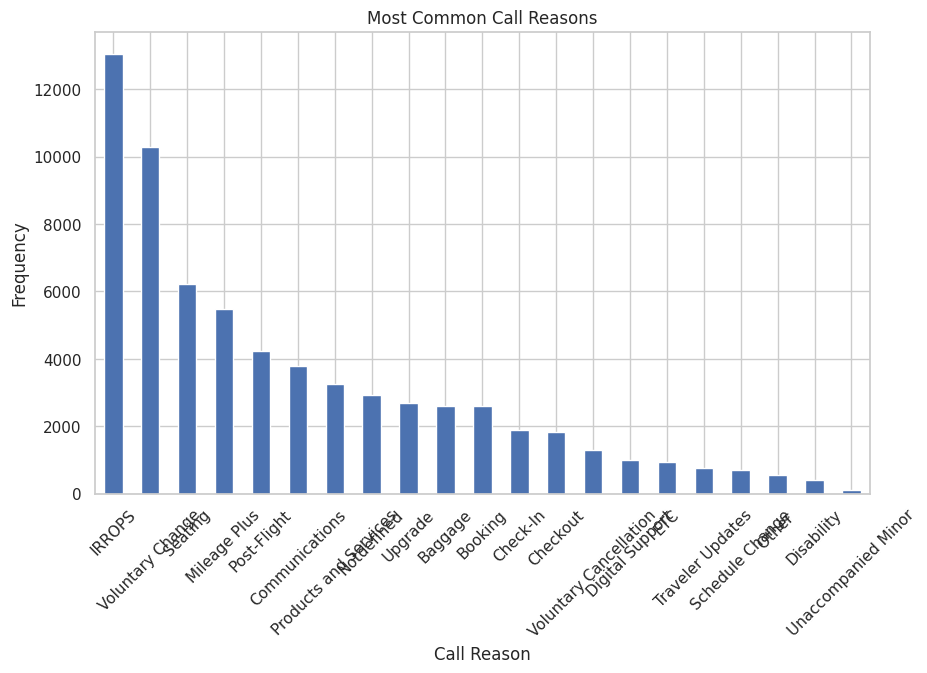

In [ ]:
# Count occurrences of each primary call reason
call_reason_counts = mrg_df['final_call_reason'].value_counts()

# Display the most common call reasons
print(call_reason_counts)

# Plot the top call reasons
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
call_reason_counts.plot(kind='bar')
plt.title('Most Common Call Reasons')
plt.xlabel('Call Reason')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()


In [ ]:
# Calculate average wait time and sentiment for elite customers vs. regular customers
elite_customers = mrg_df[mrg_df['elite_level_code'] > 0]  # Assuming elite_level_code > 0 indicates elite customers
regular_customers = mrg_df[mrg_df['elite_level_code'].isnull()]  # Assuming null indicates regular customers

# Calculate averages
elite_avg_waiting_time = elite_customers['waiting_time'].mean()
elite_avg_sentiment = elite_customers['average_sentiment'].mean()

regular_avg_waiting_time = regular_customers['waiting_time'].mean()
regular_avg_sentiment = regular_customers['average_sentiment'].mean()

# Print results
print(f'Elite Customers - Average Waiting Time: {elite_avg_waiting_time} seconds, Average Sentiment: {elite_avg_sentiment}')
print(f'Regular Customers - Average Waiting Time: {regular_avg_waiting_time} seconds, Average Sentiment: {regular_avg_sentiment}')


Elite Customers - Average Waiting Time: 431.5397193078076 seconds, Average Sentiment: -0.034032940053195126
Regular Customers - Average Waiting Time: 442.934179222839 seconds, Average Sentiment: -0.033364697026721866


In [ ]:
mrg_df['final_call_reason'].unique()

array(['Notdefined', 'Booking', 'IRROPS', 'Upgrade', 'Seating',
       'Checkout', 'Post-Flight', 'Check-In', 'Communications',
       'Schedule Change', 'Products and Services', 'Disability',
       'Unaccompanied Minor', 'ETC', 'Voluntary Change', 'Mileage Plus',
       'Baggage', 'Traveler Updates', 'Voluntary Cancellation', 'Other ',
       'Digital Support'], dtype=object)

REASON


test=mrf_df.groupby

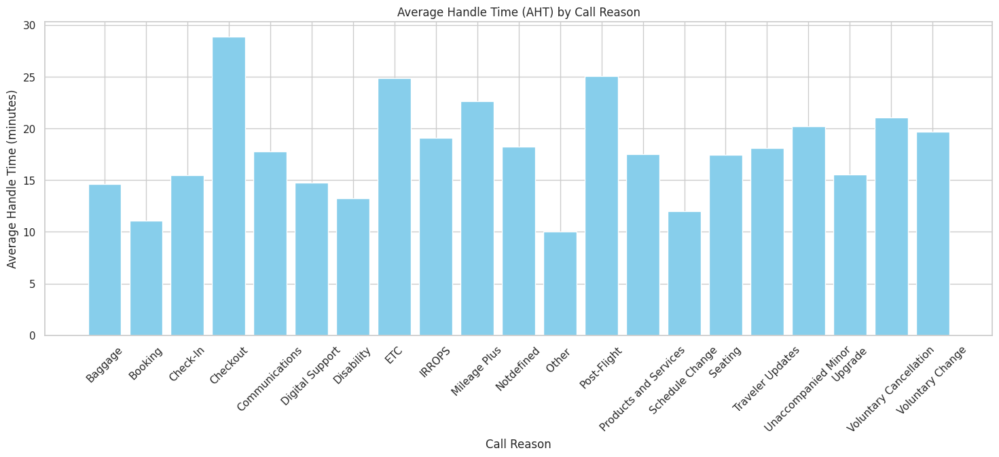

In [ ]:
# Calculate Average Handle Time (AHT) by final_call_reason
aht_by_reason = mrg_df.groupby('final_call_reason')['call_duration'].mean().reset_index()

# Convert AHT to minutes
aht_by_reason['AHT (minutes)'] = aht_by_reason['call_duration'] / 60

# Plot AHT by Call Reason
plt.figure(figsize=(18, 6))
plt.bar(aht_by_reason['final_call_reason'], aht_by_reason['AHT (minutes)'], color='skyblue')
plt.title('Average Handle Time (AHT) by Call Reason')
plt.xlabel('Call Reason')
plt.ylabel('Average Handle Time (minutes)')
plt.xticks(rotation=45)
plt.show()


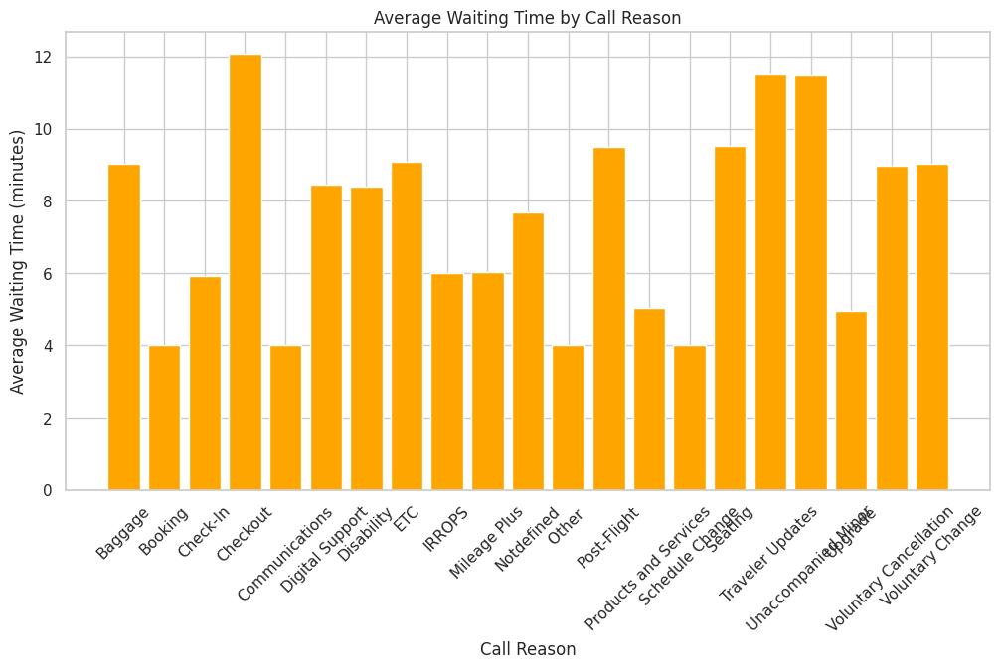

In [ ]:
# Calculate Average Waiting Time by final_call_reason
waiting_time_by_reason = mrg_df.groupby('final_call_reason')['waiting_time'].mean().reset_index()

# Convert Waiting Time to minutes
waiting_time_by_reason['Waiting Time (minutes)'] = waiting_time_by_reason['waiting_time'] / 60

# Plot Average Waiting Time by Call Reason
plt.figure(figsize=(12, 6))
plt.bar(waiting_time_by_reason['final_call_reason'], waiting_time_by_reason['Waiting Time (minutes)'], color='orange')
plt.title('Average Waiting Time by Call Reason')
plt.xlabel('Call Reason')
plt.ylabel('Average Waiting Time (minutes)')
plt.xticks(rotation=45)
plt.show()


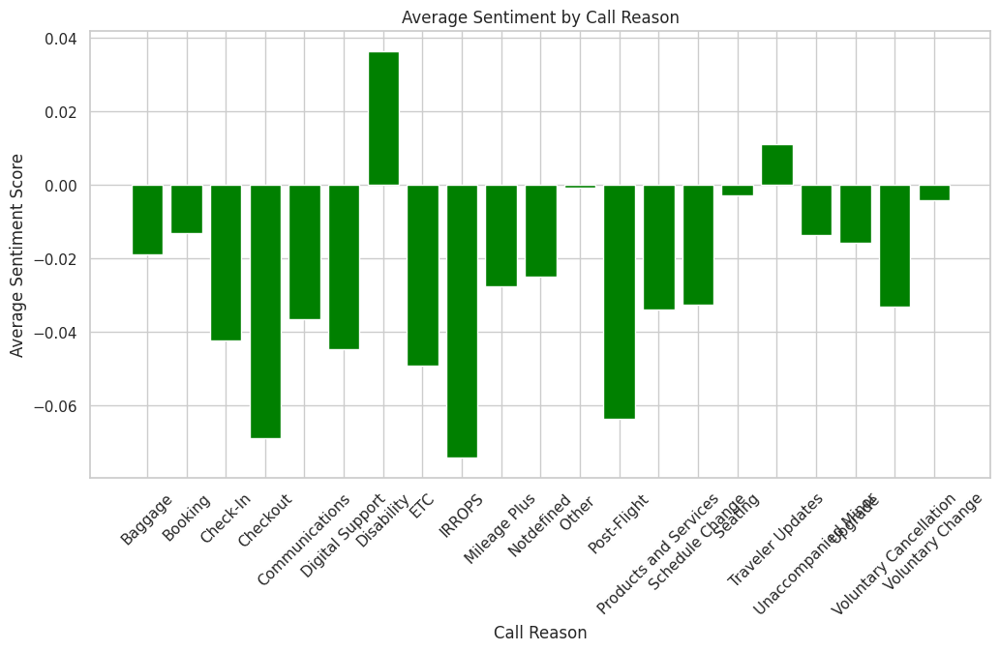

In [ ]:
# Calculate Average Sentiment by final_call_reason
sentiment_by_reason = mrg_df.groupby('final_call_reason')['average_sentiment'].mean().reset_index()

# Plot Average Sentiment by Call Reason
plt.figure(figsize=(12, 6))
plt.bar(sentiment_by_reason['final_call_reason'], sentiment_by_reason['average_sentiment'], color='green')
plt.title('Average Sentiment by Call Reason')
plt.xlabel('Call Reason')
plt.ylabel('Average Sentiment Score')
plt.xticks(rotation=45)
plt.show()


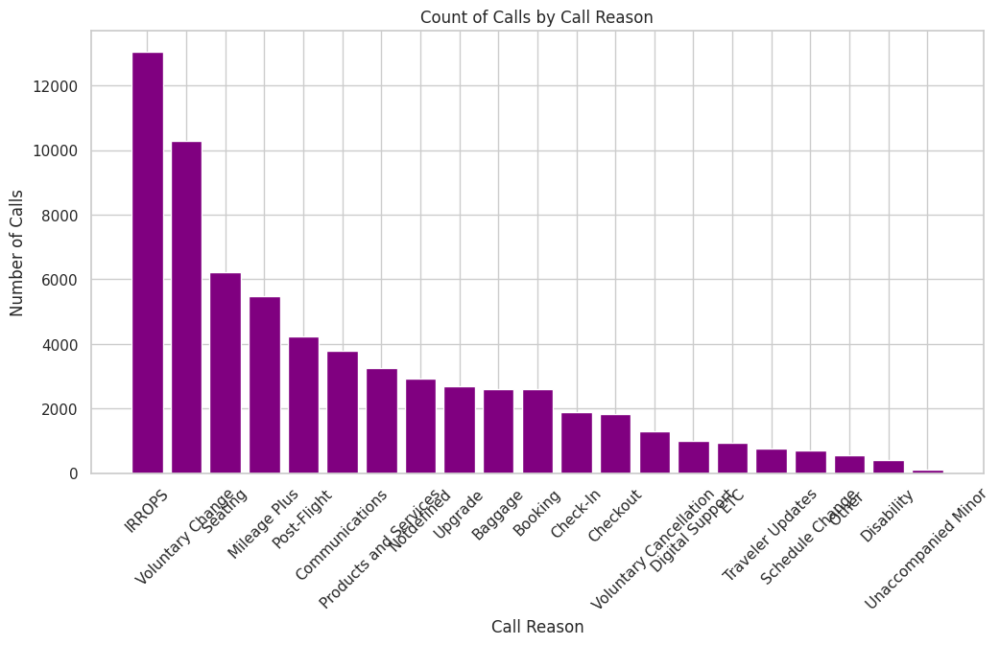

In [ ]:
# Count occurrences of each call reason
call_counts_by_reason = mrg_df['final_call_reason'].value_counts().reset_index()
call_counts_by_reason.columns = ['Call Reason', 'Call Count']

# Plot Count of Calls by Call Reason
plt.figure(figsize=(12, 6))
plt.bar(call_counts_by_reason['Call Reason'], call_counts_by_reason['Call Count'], color='purple')
plt.title('Count of Calls by Call Reason')
plt.xlabel('Call Reason')
plt.ylabel('Number of Calls')
plt.xticks(rotation=45)
plt.show()


In [ ]:
# Create a pivot table to analyze tone combinations and primary reasons
tone_pivot = pd.pivot_table(mrg_df, index=['customer_tone', 'agent_tone'], columns='final_call_reason', aggfunc='size', fill_value=0)

# Sort to find rare combinations
rare_tone_combinations = tone_pivot[tone_pivot.sum(axis=1) < 10]  # Rare if less than 10 occurrences

print(rare_tone_combinations)


Empty DataFrame
Columns: [Baggage, Booking, Check-In, Checkout, Communications, Digital Support, Disability, ETC, IRROPS, Mileage Plus, Notdefined, Other , Post-Flight, Products and Services, Schedule Change, Seating, Traveler Updates, Unaccompanied Minor, Upgrade, Voluntary Cancellation, Voluntary Change]
Index: []

[0 rows x 21 columns]


In [ ]:
# Group by primary_call_reason and calculate average sentiment and variance
sentiment_stats = mrg_df.groupby('final_call_reason')['average_sentiment'].agg(['mean', 'std']).reset_index()

# Sort to find reasons with high sentiment variance
high_variance_sentiment = sentiment_stats[sentiment_stats['std'] > 0.14]  # High variance threshold (adjust based on data)
print(high_variance_sentiment)


         final_call_reason      mean       std
0                  Baggage -0.018988  0.165929
1                  Booking -0.013252  0.145998
5          Digital Support -0.044864  0.154907
6               Disability  0.036497  0.142896
7                      ETC -0.049139  0.140482
8                   IRROPS -0.074181  0.147464
10              Notdefined -0.024875  0.151526
12             Post-Flight -0.063814  0.145823
13   Products and Services -0.033822  0.141456
14         Schedule Change -0.032560  0.150346
16        Traveler Updates  0.011160  0.145767
19  Voluntary Cancellation -0.033183  0.149019


In [ ]:
sentiment_stats

,final_call_reason,mean,std
0,Baggage,-0.018988,0.165929
1,Booking,-0.013252,0.145998
2,Check-In,-0.042388,0.139383
3,Checkout,-0.068874,0.136885
4,Communications,-0.036694,0.138992
5,Digital Support,-0.044864,0.154907
6,Disability,0.036497,0.142896
7,ETC,-0.049139,0.140482
8,IRROPS,-0.074181,0.147464
9,Mileage Plus,-0.027659,0.125791


In [ ]:
# Group by primary_call_reason and analyze silence_percent_average
silence_stats = mrg_df.groupby('final_call_reason')['silence_percent_average'].agg(['mean', 'std', 'max']).reset_index()
silence_stats
# Look for high silence in certain call reasons
high_silence_reasons = silence_stats[silence_stats['mean'] > 0.27]  # Calls with average silence > 50%
print(high_silence_reasons)


         final_call_reason      mean       std   max
3                 Checkout  0.290815  0.191494  0.85
4           Communications  0.303975  0.181166  0.92
5          Digital Support  0.289568  0.206568  0.89
7                      ETC  0.287086  0.187011  0.89
8                   IRROPS  0.309120  0.196689  0.93
9             Mileage Plus  0.274915  0.178559  0.84
10              Notdefined  0.279328  0.193189  0.97
11                  Other   0.277940  0.214051  0.97
12             Post-Flight  0.297607  0.191357  0.93
13   Products and Services  0.276732  0.195601  0.90
16        Traveler Updates  0.288225  0.198474  0.88
18                 Upgrade  0.277487  0.193886  0.90
19  Voluntary Cancellation  0.283160  0.198442  0.97
20        Voluntary Change  0.289706  0.187459  0.95


In [ ]:
silence_stats



,final_call_reason,mean,std,max
0,Baggage,0.250711,0.209200,0.98
1,Booking,0.261298,0.194690,0.96
2,Check-In,0.262539,0.183752,0.90
3,Checkout,0.290815,0.191494,0.85
4,Communications,0.303975,0.181166,0.92
5,Digital Support,0.289568,0.206568,0.89
6,Disability,0.246548,0.182309,0.84
7,ETC,0.287086,0.187011,0.89
8,IRROPS,0.309120,0.196689,0.93
9,Mileage Plus,0.274915,0.178559,0.84


In [ ]:
# Create a crosstab for elite_level_code vs primary_call_reason
elite_vs_reason = pd.crosstab(mrg_df['elite_level_code'], mrg_df['final_call_reason'], normalize='index')

# Sort to find rare occurrences of call reasons for elite customers
print(elite_vs_reason)


final_call_reason   Baggage   Booking  Check-In  Checkout  Communications  \
elite_level_code                                                            
0.0                0.039811  0.038986  0.027965  0.029090        0.055481   
1.0                0.043560  0.038387  0.026316  0.025641        0.059304   
2.0                0.036020  0.032941  0.025710  0.025442        0.052491   
3.0                0.035579  0.034822  0.027631  0.022899        0.050908   
4.0                0.000000  0.031107  0.021418  0.017338        0.038756   
5.0                0.000000  0.019923  0.014559  0.014559        0.024521   

final_call_reason  Digital Support  Disability       ETC    IRROPS  \
elite_level_code                                                     
0.0                       0.015220    0.005548  0.014170  0.193807   
1.0                       0.016044    0.006223  0.012296  0.191258   
2.0                       0.013524    0.005892  0.025844  0.180503   
3.0                       0.01286

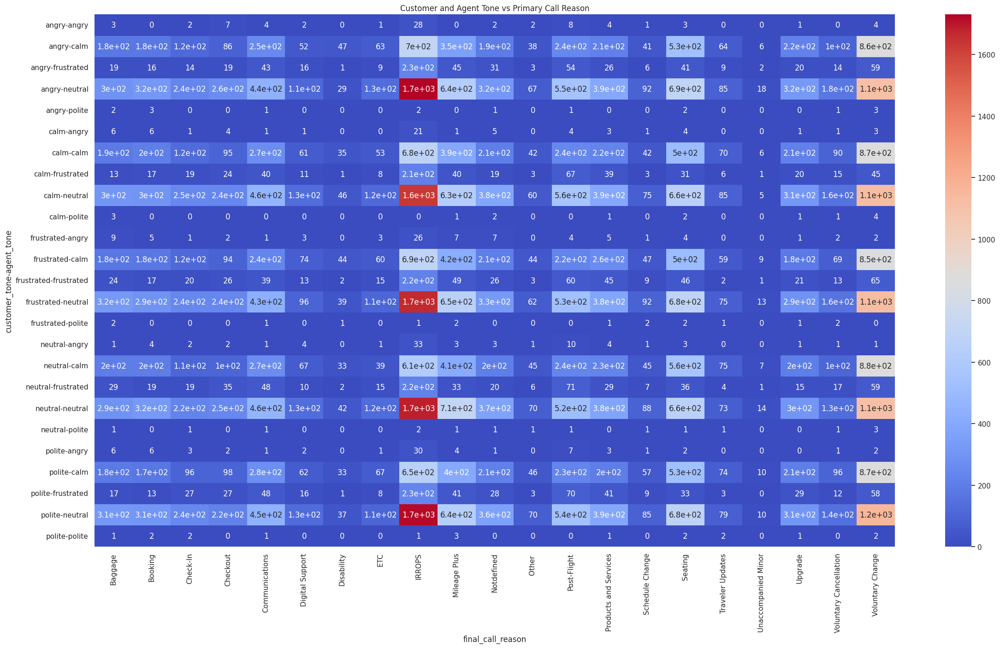

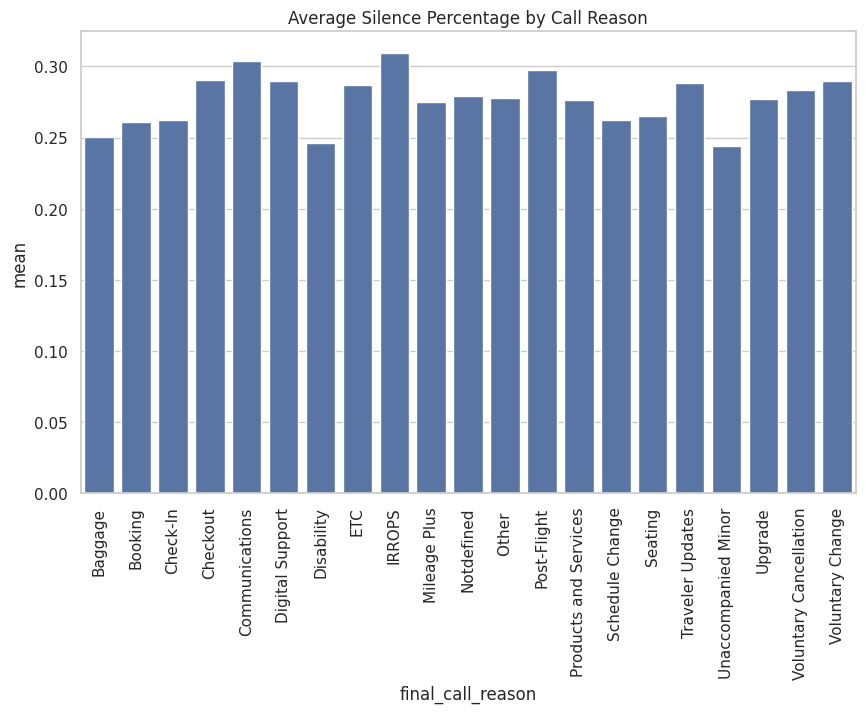

<Figure size 1000x600 with 0 Axes>

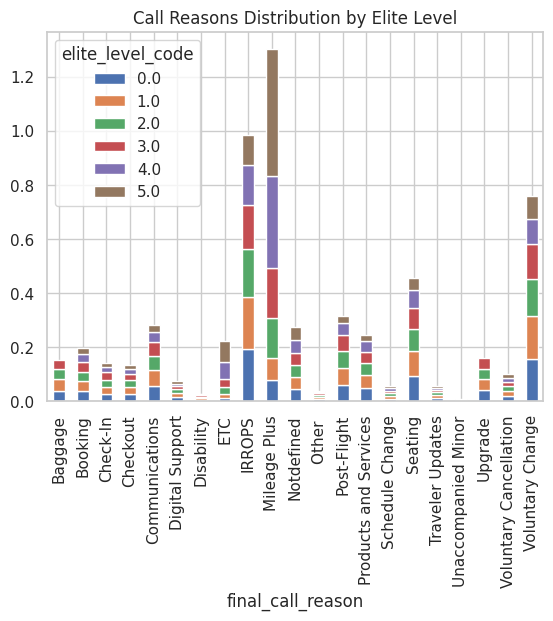

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Visualize tone combinations with call reasons
plt.figure(figsize=(28,15))
sns.heatmap(tone_pivot, annot=True, cmap='coolwarm')
plt.title('Customer and Agent Tone vs Primary Call Reason')
plt.show()

# Visualize silence percentage for each call reason
plt.figure(figsize=(10, 6))
sns.barplot(x='final_call_reason', y='mean', data=silence_stats)
plt.xticks(rotation=90)
plt.title('Average Silence Percentage by Call Reason')
plt.show()

# Visualize elite-level vs call reason distributions
plt.figure(figsize=(10, 6))
elite_vs_reason.T.plot(kind='bar', stacked=True)
plt.title('Call Reasons Distribution by Elite Level')
plt.show()


In [ ]:
mrg_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66653 entries, 0 to 66652
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   call_id                  66653 non-null  int64         
 1   customer_id              66653 non-null  int64         
 2   agent_id_x               66653 non-null  int64         
 3   call_start_datetime      66653 non-null  datetime64[ns]
 4   agent_assigned_datetime  66653 non-null  datetime64[ns]
 5   call_end_datetime        66653 non-null  datetime64[ns]
 6   call_transcript          66653 non-null  object        
 7   customer_name            66653 non-null  object        
 8   elite_level_code         42694 non-null  float64       
 9   agent_tone               66455 non-null  object        
 10  customer_tone            66653 non-null  object        
 11  average_sentiment        66552 non-null  float64       
 12  silence_percent_average  66653 n

In [ ]:
!pip install nltk


In [ ]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

NPL OF TRANCRIPT

In [ ]:
mrg_df.columns

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import LabelEncoder, StandardScaler

# Step 1: Preprocessing text data (call transcript)
def clean_text(text):
    # Clean the text (remove special characters, lowercase)
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    text = text.lower()
    return text

mrg_df['cleaned_transcript'] = mrg_df['call_transcript'].apply(clean_text)

# Step 2: Vectorizing transcript using TF-IDF
tfidf_vectorizer = TfidfVectorizer(max_features=5000, ngram_range=(1, 2))
X_text = tfidf_vectorizer.fit_transform(mrg_df['cleaned_transcript'])

# Step 3: Encoding categorical columns
# Encode 'agent_tone' and 'customer_tone' as these are categorical
label_encoder_tone = LabelEncoder()
mrg_df['encoded_agent_tone'] = label_encoder_tone.fit_transform(mrg_df['agent_tone'].fillna('Unknown'))
mrg_df['encoded_customer_tone'] = label_encoder_tone.fit_transform(mrg_df['customer_tone'])

# Step 4: Combining other numerical features with TF-IDF embeddings
# Scaling numerical features
scaler = StandardScaler()
X_num = scaler.fit_transform(mrg_df[['average_sentiment', 'silence_percent_average', 'call_duration', 'waiting_time']])

# Step 5: Merging features (text embeddings + other features)
import scipy
X_combined = scipy.sparse.hstack([X_text, X_num, mrg_df[['encoded_agent_tone', 'encoded_customer_tone']]])

# Step 6: Encoding the target variable (final_call_reason)
label_encoder_reason = LabelEncoder()
y = label_encoder_reason.fit_transform(mrg_df['final_call_reason'])

# Step 7: Splitting the dataset
X_train, X_test, y_train, y_test = train_test_split(X_combined, y, test_size=0.2, random_state=42)

# Step 8: Training a Random Forest Classifier
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
rf_clf.fit(X_train, y_train)

# Step 9: Making predictions and evaluating the model
y_pred = rf_clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.4f}')
print(classification_report(y_test, y_pred, target_names=label_encoder_reason.classes_))


Accuracy: 0.3005
                        precision    recall  f1-score   support

               Baggage       1.00      0.00      0.00       506
               Booking       0.36      0.05      0.08       500
              Check-In       0.00      0.00      0.00       379
              Checkout       0.00      0.00      0.00       371
        Communications       0.21      0.01      0.01       769
       Digital Support       0.00      0.00      0.00       195
            Disability       0.00      0.00      0.00        71
                   ETC       0.00      0.00      0.00       190
                IRROPS       0.31      0.92      0.46      2610
          Mileage Plus       0.25      0.04      0.07      1088
            Notdefined       0.00      0.00      0.00       603
                Other        0.00      0.00      0.00       114
           Post-Flight       0.48      0.19      0.28       850
 Products and Services       0.39      0.04      0.07       660
       Schedule Change

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


oriented 2


In [ ]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt


# Group transcripts by final call reason
grouped_transcripts = mrg_df.groupby('final_call_reason')['cleaned_transcript'].apply(lambda x: ' '.join(x))




Generating word cloud for: Baggage


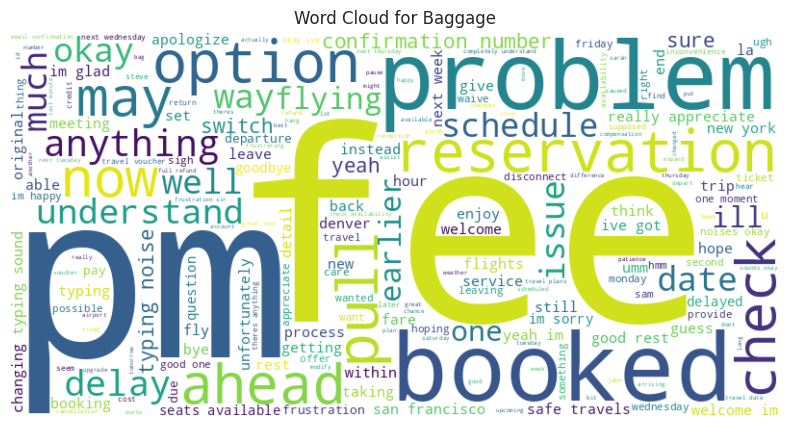

Generating word cloud for: Booking


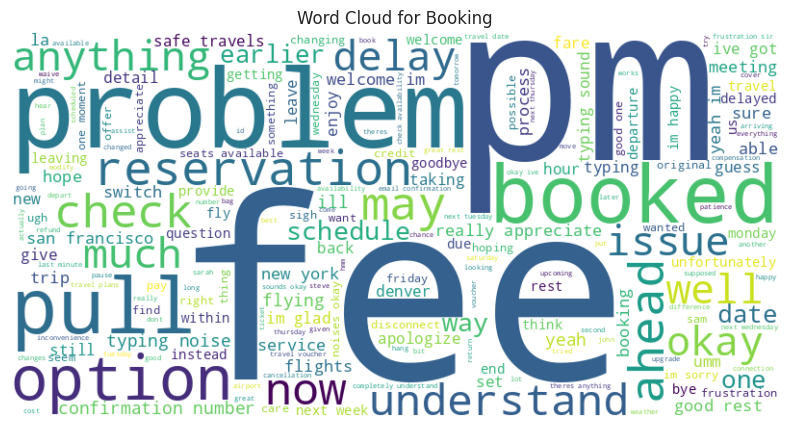

Generating word cloud for: Check-In


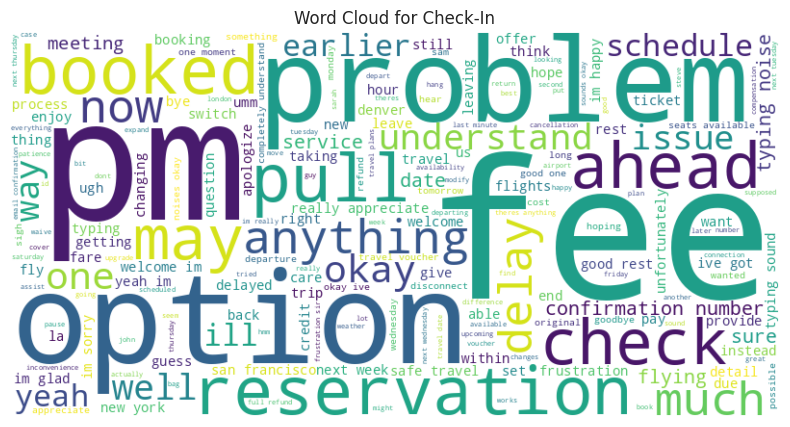

Generating word cloud for: Checkout


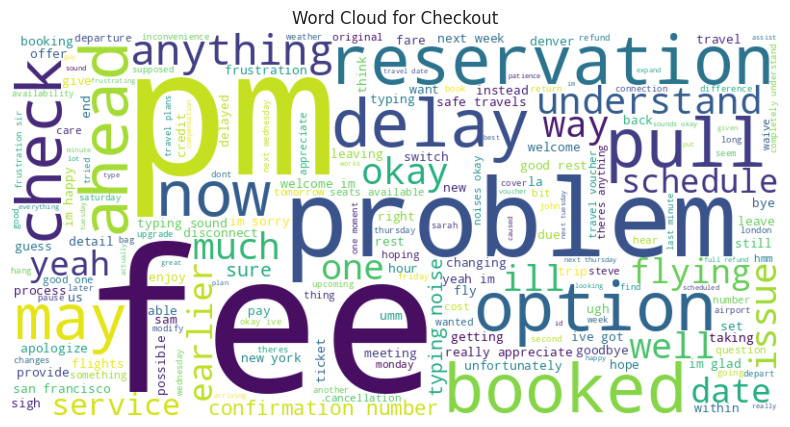

Generating word cloud for: Communications


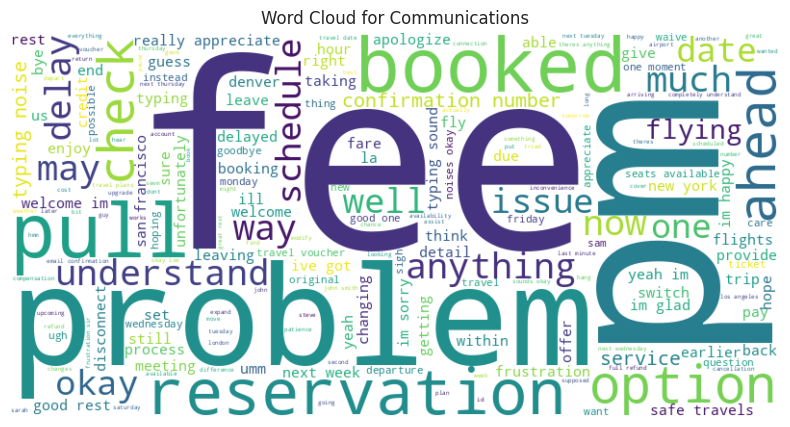

Generating word cloud for: Digital Support


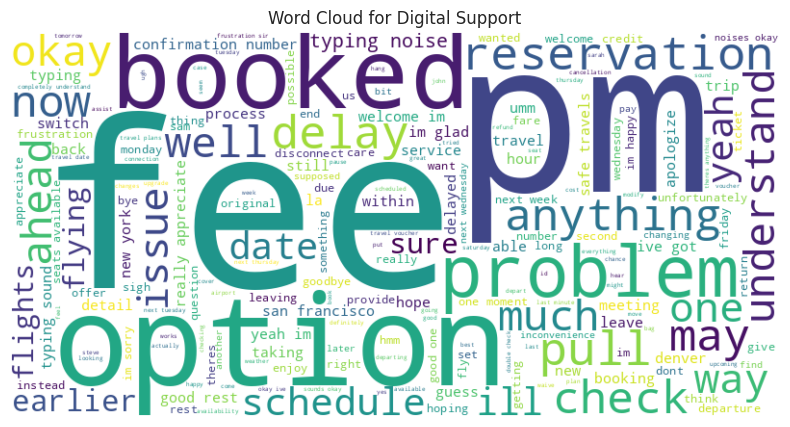

Generating word cloud for: Disability


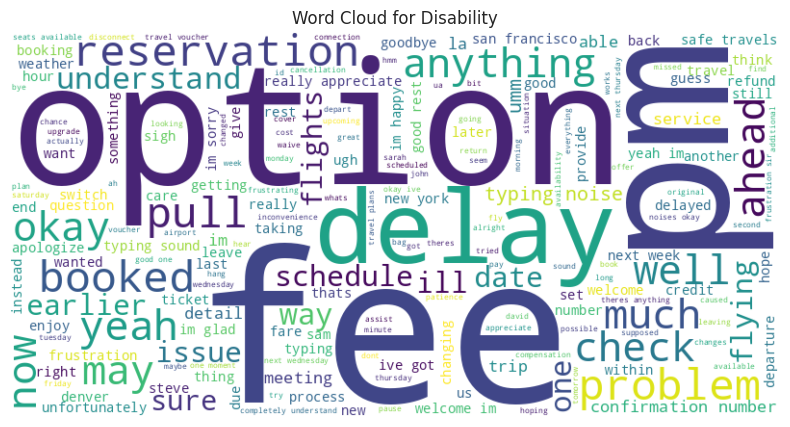

Generating word cloud for: ETC


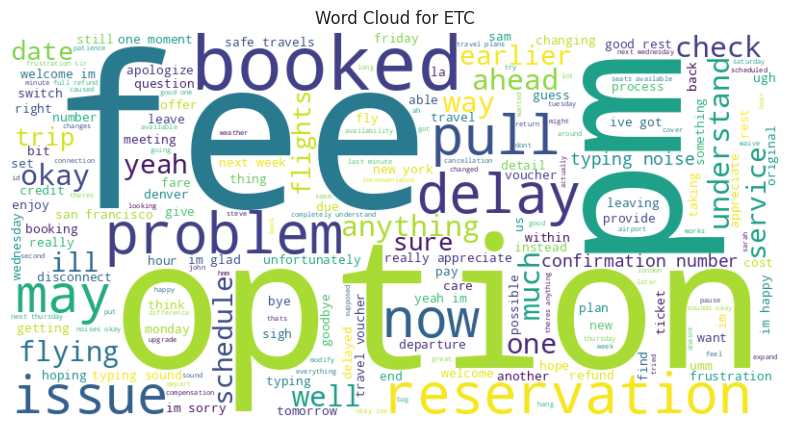

Generating word cloud for: IRROPS


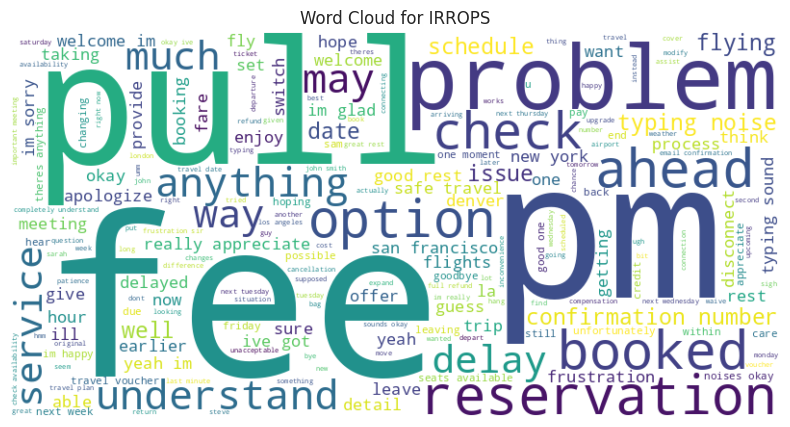

Generating word cloud for: Mileage Plus


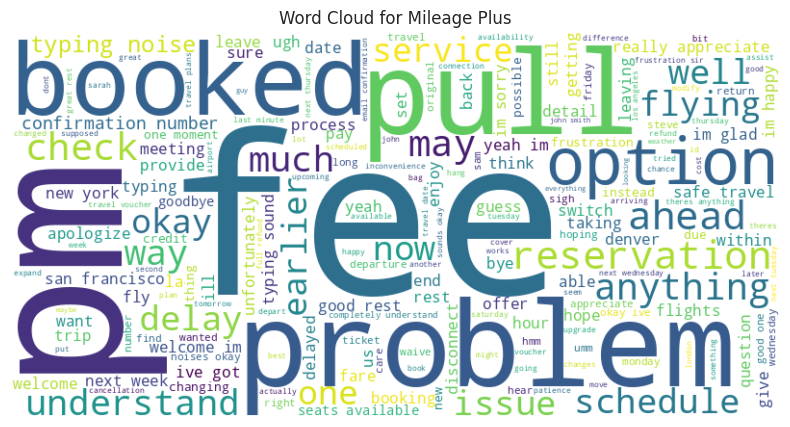

Generating word cloud for: Notdefined


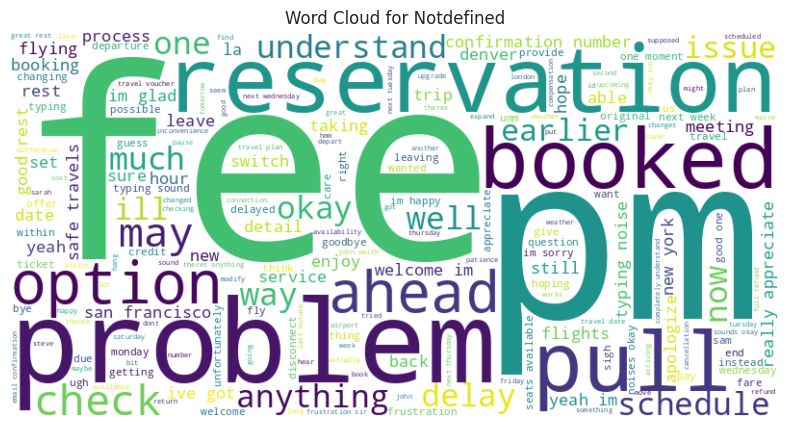

Generating word cloud for: Other 


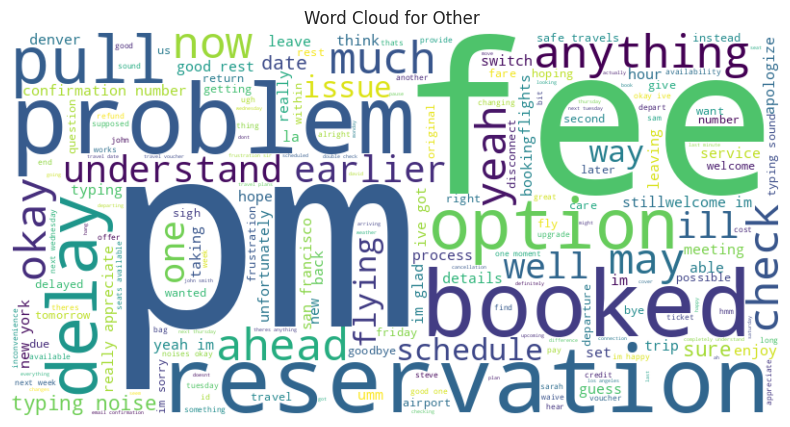

Generating word cloud for: Post-Flight


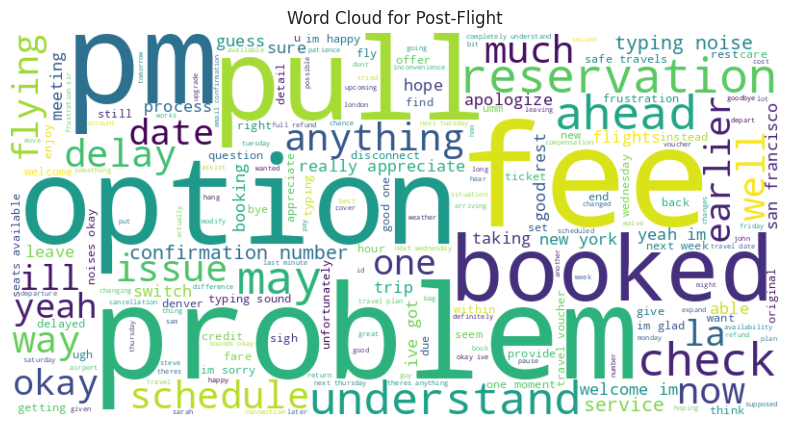

Generating word cloud for: Products and Services


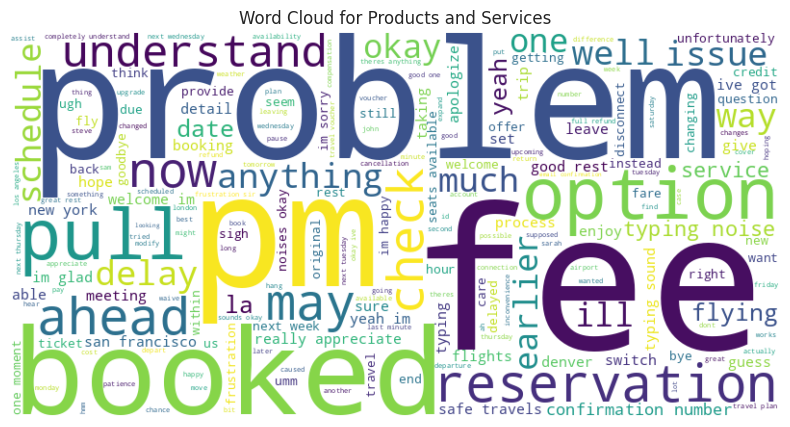

Generating word cloud for: Schedule Change


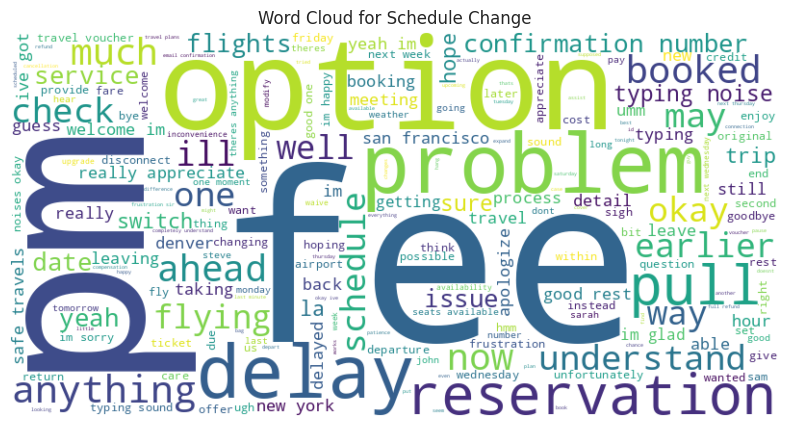

Generating word cloud for: Seating


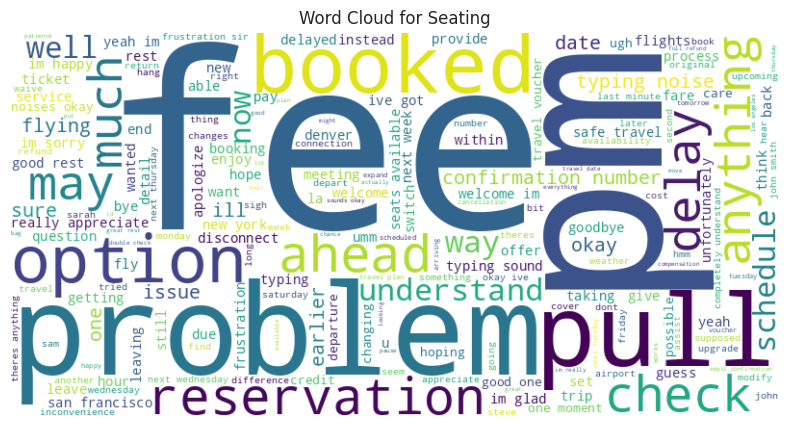

Generating word cloud for: Traveler Updates


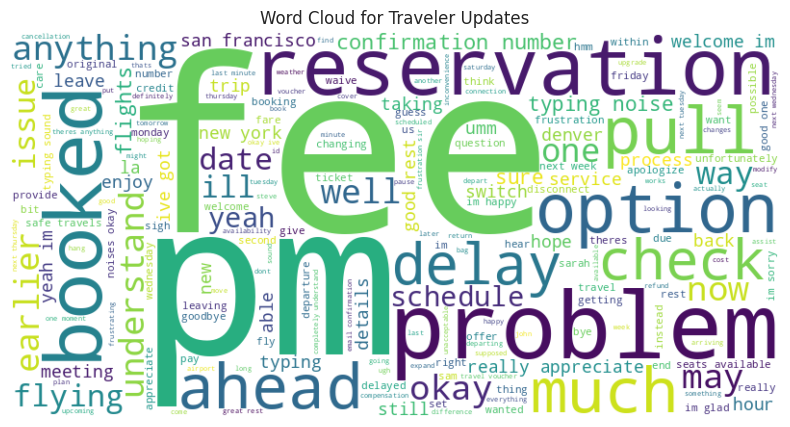

Generating word cloud for: Unaccompanied Minor


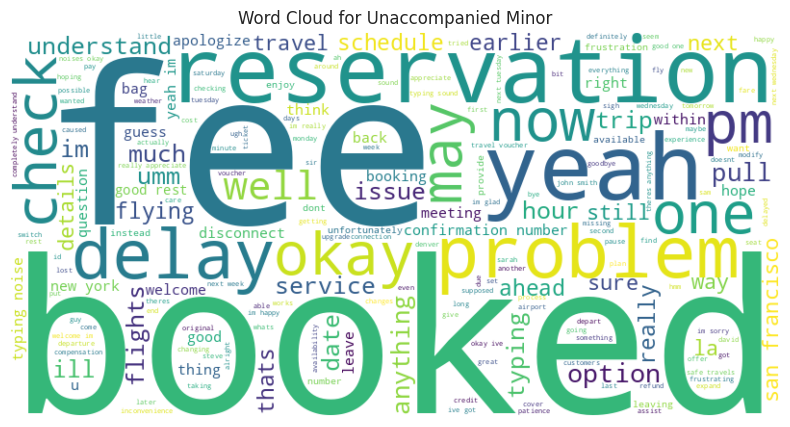

Generating word cloud for: Upgrade


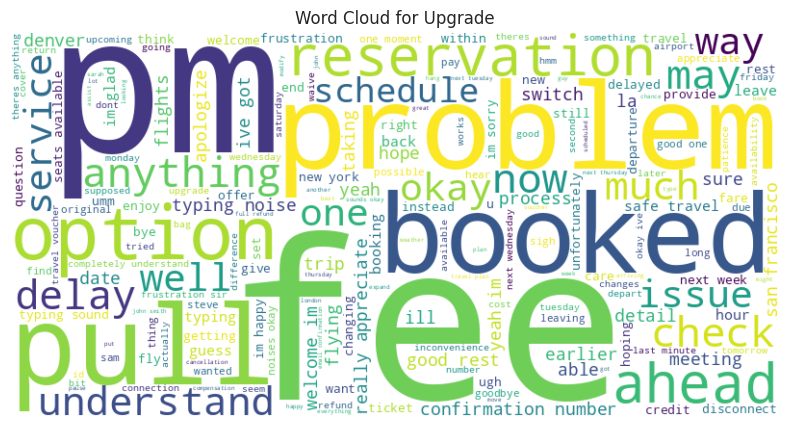

Generating word cloud for: Voluntary Cancellation


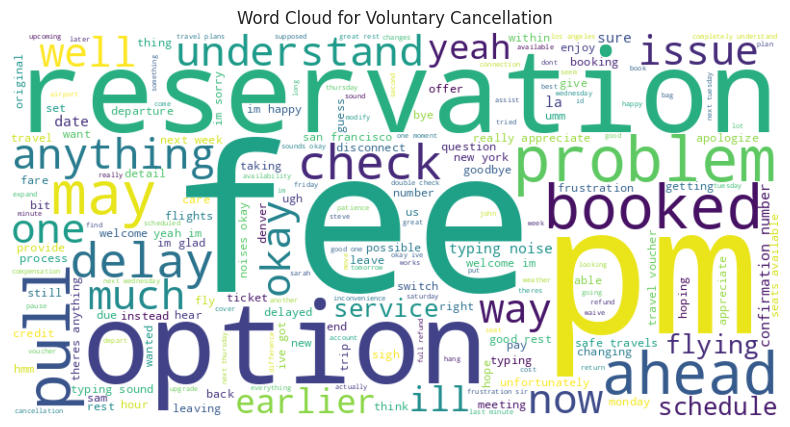

Generating word cloud for: Voluntary Change


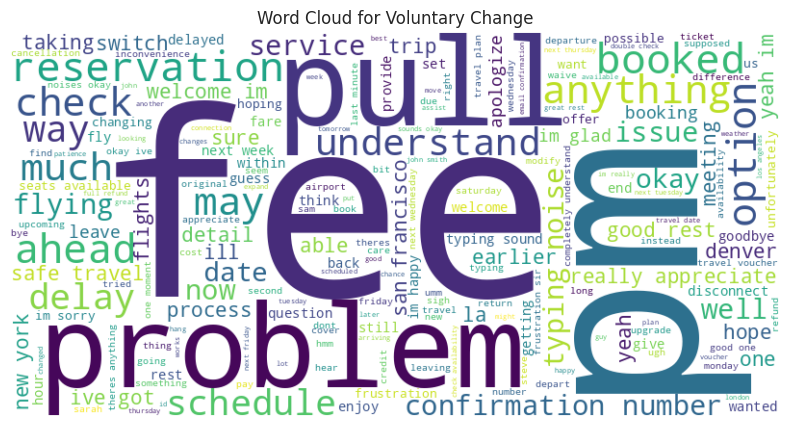

In [ ]:
import pandas as pd
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt



# Group transcripts by final call reason
grouped_transcripts = mrg_df.groupby('final_call_reason')['cleaned_transcript'].apply(lambda x: ' '.join(x))

# Define custom stopwords (optional, in addition to default stopwords)

custom_stopwords = set(STOPWORDS).union({"chicago","will","go","name","better","today","airlines","please","make","day","thanks","customer","united","airline","time","calling","youre","hi","see","flight", "help", "take", "look", "agent", "call","need","thank","unites","know","let","looks","change","work",})

# Function to generate word cloud with stopwords
def generate_wordcloud(text, reason):
    wordcloud = WordCloud(width=800, height=400, background_color='white', stopwords=custom_stopwords).generate(text)

    # Plot the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Word Cloud for {reason}")
    plt.show()

# Generate word clouds for each reason with stopwords
for reason, transcript in grouped_transcripts.items():
    print(f"Generating word cloud for: {reason}")
    generate_wordcloud(transcript, reason)


In [ ]:
# Sentiment analysis by reason
sentiment_by_reason = mrg_df.groupby('final_call_reason')['average_sentiment'].mean()

# Tone analysis by reason
tone_by_reason = mrg_df.groupby('final_call_reason')[['encoded_agent_tone', 'encoded_customer_tone']].mean()

# Display
print(sentiment_by_reason)
print(tone_by_reason)


final_call_reason
Baggage                  -0.015071
Booking                  -0.012685
Check-In                 -0.041631
Checkout                 -0.067366
Communications           -0.036135
Digital Support          -0.044864
Disability                0.037863
ETC                      -0.048060
IRROPS                   -0.073158
Mileage Plus             -0.026964
Notdefined               -0.024321
Other                    -0.000671
Post-Flight              -0.062514
Products and Services    -0.032927
Schedule Change          -0.031048
Seating                  -0.002540
Traveler Updates          0.011160
Unaccompanied Minor      -0.013689
Upgrade                  -0.015872
Voluntary Cancellation   -0.031362
Voluntary Change         -0.003541
Name: average_sentiment, dtype: float64
                        encoded_agent_tone  encoded_customer_tone
final_call_reason                                                
Baggage                           2.217894               2.017740
Booking  

In [ ]:
# Waiting time per reason
waiting_time_by_reason = mrg_df.groupby('final_call_reason')['waiting_time'].mean()

# Call duration per reason
duration_by_reason = mrg_df.groupby('final_call_reason')['call_duration'].mean()

# Display
print(waiting_time_by_reason)
print(duration_by_reason)


final_call_reason
Baggage                   541.943695
Booking                   240.232829
Check-In                  355.893048
Checkout                  725.070883
Communications            239.936424
Digital Support           506.458123
Disability                504.122137
ETC                       544.655172
IRROPS                    360.230574
Mileage Plus              361.161856
Notdefined                460.717949
Other                     240.318021
Post-Flight               569.381663
Products and Services     302.135624
Schedule Change           240.934844
Seating                   570.787059
Traveler Updates          690.352021
Unaccompanied Minor       687.961165
Upgrade                   298.365062
Voluntary Cancellation    538.476923
Voluntary Change          540.870497
Name: waiting_time, dtype: float64
final_call_reason
Baggage                    878.804474
Booking                    667.101281
Check-In                   929.069519
Checkout                  1736.270447


In [ ]:
# Segmentation based on elite level
elite_customers = mrg_df[mrg_df['elite_level_code'] > 0]
non_elite_customers = mrg_df[mrg_df['elite_level_code'] == 0]

# Calculate the average metrics
elite_metrics = elite_customers[['waiting_time', 'call_duration', 'average_sentiment']].mean()
non_elite_metrics = non_elite_customers[['waiting_time', 'call_duration', 'average_sentiment']].mean()

print("Elite Customer Metrics:", elite_metrics)
print("Non-Elite Customer Metrics:", non_elite_metrics)


Elite Customer Metrics: waiting_time          431.578013
call_duration        1151.766473
average_sentiment      -0.033210
dtype: float64
Non-Elite Customer Metrics: waiting_time          441.177990
call_duration        1122.255886
average_sentiment      -0.032380
dtype: float64


In [ ]:
negative_sentiment_threshold = 0

# Filter the dataset for rows where the sentiment is negative
negative_sentiment_df = mrg_df[mrg_df['average_sentiment'] < negative_sentiment_threshold]

# Group by final call reason, agent tone, and customer tone
grouped_negative_sentiment = negative_sentiment_df.groupby(['final_call_reason', 'customer_tone']).size().reset_index(name='negative_sentiment_count')

# Sort by the highest count of negative sentiment to highlight the most common problematic reasons and tones
grouped_negative_sentiment_sorted = grouped_negative_sentiment.sort_values(by='negative_sentiment_count', ascending=False)

# Display the top results that lead to negative sentiment
print(grouped_negative_sentiment_sorted.head(10))

    final_call_reason customer_tone  negative_sentiment_count
40             IRROPS         angry                      1787
44             IRROPS        polite                      1759
43             IRROPS       neutral                      1735
42             IRROPS    frustrated                      1715
41             IRROPS          calm                      1680
104  Voluntary Change        polite                       965
102  Voluntary Change    frustrated                       951
100  Voluntary Change         angry                       934
103  Voluntary Change       neutral                       906
101  Voluntary Change          calm                       892


/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When 

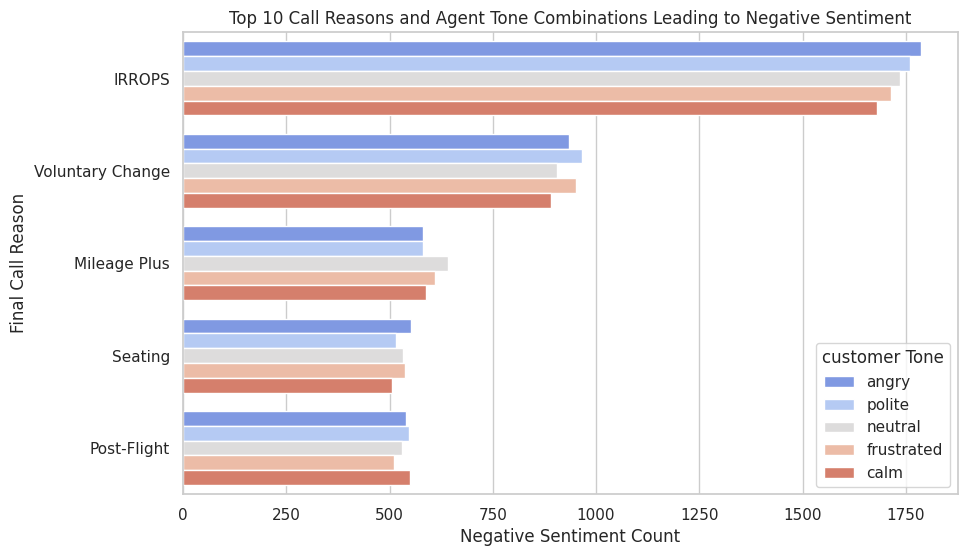

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot the top 10 results as a bar chart
top_negative_sentiment = grouped_negative_sentiment_sorted.head(25)

plt.figure(figsize=(10, 6))
sns.barplot(x='negative_sentiment_count', y='final_call_reason', hue='customer_tone', data=top_negative_sentiment, palette='coolwarm')
plt.title('Top 10 Call Reasons and Agent Tone Combinations Leading to Negative Sentiment')
plt.xlabel('Negative Sentiment Count')
plt.ylabel('Final Call Reason')
plt.legend(title='customer Tone')
plt.show()


In [ ]:
# Calculate average sentiment for each call reason
average_sentiment_by_reason = mrg_df.groupby('final_call_reason')['average_sentiment'].mean().reset_index()

# Add a column to indicate whether the average sentiment is negative
average_sentiment_by_reason['is_negative'] = average_sentiment_by_reason['average_sentiment'] < negative_sentiment_threshold

# Sort the results to find call reasons with the most negative sentiment
average_sentiment_by_reason_sorted = average_sentiment_by_reason.sort_values(by='average_sentiment')

print(average_sentiment_by_reason_sorted)


         final_call_reason  average_sentiment  is_negative
8                   IRROPS          -0.073158         True
3                 Checkout          -0.067366         True
12             Post-Flight          -0.062514         True
7                      ETC          -0.048060         True
5          Digital Support          -0.044864         True
2                 Check-In          -0.041631         True
4           Communications          -0.036135         True
13   Products and Services          -0.032927         True
19  Voluntary Cancellation          -0.031362         True
14         Schedule Change          -0.031048         True
9             Mileage Plus          -0.026964         True
10              Notdefined          -0.024321         True
18                 Upgrade          -0.015872         True
0                  Baggage          -0.015071         True
17     Unaccompanied Minor          -0.013689         True
1                  Booking          -0.012685         Tr

In [ ]:
# Filter for call reasons that trigger negative sentiment
negative_sentiment_reasons = average_sentiment_by_reason_sorted[average_sentiment_by_reason_sorted['is_negative']]

print("Call Reasons Triggering Negative Sentiment:")
print(negative_sentiment_reasons)


Call Reasons Triggering Negative Sentiment:
         final_call_reason  average_sentiment  is_negative
8                   IRROPS          -0.073158         True
3                 Checkout          -0.067366         True
12             Post-Flight          -0.062514         True
7                      ETC          -0.048060         True
5          Digital Support          -0.044864         True
2                 Check-In          -0.041631         True
4           Communications          -0.036135         True
13   Products and Services          -0.032927         True
19  Voluntary Cancellation          -0.031362         True
14         Schedule Change          -0.031048         True
9             Mileage Plus          -0.026964         True
10              Notdefined          -0.024321         True
18                 Upgrade          -0.015872         True
0                  Baggage          -0.015071         True
17     Unaccompanied Minor          -0.013689         True
1           

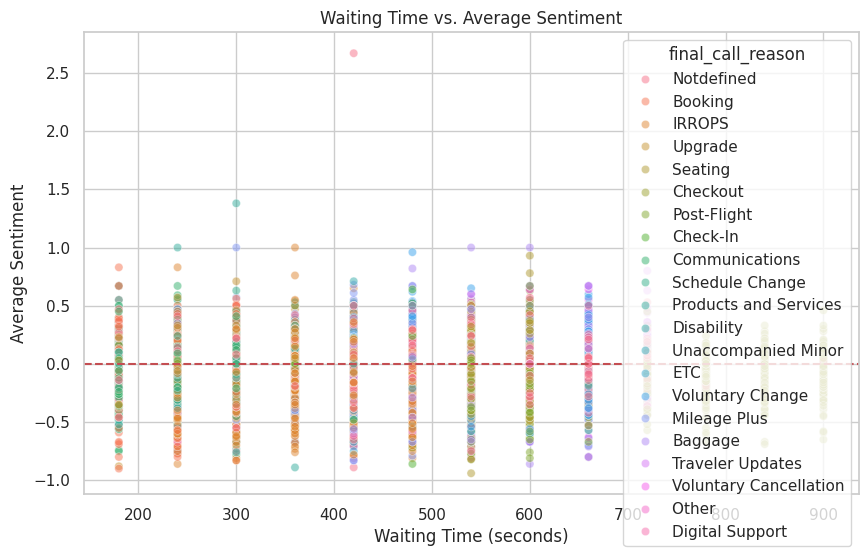

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Scatter plot to visualize the relationship between waiting time and average sentiment
plt.figure(figsize=(10, 6))
sns.scatterplot(data=mrg_df, x='waiting_time', y='average_sentiment', hue='final_call_reason', alpha=0.5)
plt.title('Waiting Time vs. Average Sentiment')
plt.xlabel('Waiting Time (seconds)')
plt.ylabel('Average Sentiment')
plt.axhline(y=0, color='r', linestyle='--')  # Add a horizontal line at y=0 for reference
plt.show()


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


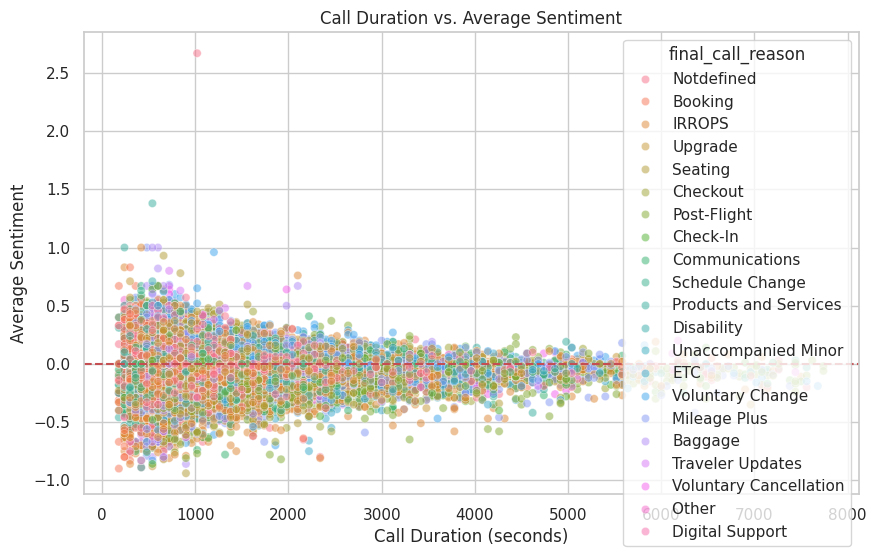

In [ ]:
# Scatter plot to visualize the relationship between call duration and average sentiment
plt.figure(figsize=(10, 6))
sns.scatterplot(data=mrg_df, x='call_duration', y='average_sentiment', hue='final_call_reason', alpha=0.5)
plt.title('Call Duration vs. Average Sentiment')
plt.xlabel('Call Duration (seconds)')
plt.ylabel('Average Sentiment')
plt.axhline(y=0, color='r', linestyle='--')  # Add a horizontal line at y=0 for reference
plt.show()


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from nltk.tokenize import word_tokenize

# Load the dataset


# Convert datetime columns to standard format
df['call_start_datetime'] = pd.to_datetime(df['call_start_datetime'])
df['agent_assigned_datetime'] = pd.to_datetime(df['agent_assigned_datetime'])
df['call_end_datetime'] = pd.to_datetime(df['call_end_datetime'])

# Extract hour of the day from call_start_datetime
df['hour_of_day'] = df['call_start_datetime'].dt.hour

# Tokenize call_transcript and cleaned_transcript columns
df['call_transcript_tokens'] = df['call_transcript'].apply(word_tokenize)
df['cleaned_transcript_tokens'] = df['cleaned_transcript'].apply(word_tokenize)

# Encode final_call_reason column using label encoder
le = LabelEncoder()
df['encoded_final_call_reason'] = le.fit_transform(df['final_call_reason'])

KeyboardInterrupt: 